# Data loading and preparation

In [1]:
# unzip the archive (from google drive, since the project was made in google colab)
#!unzip "drive/MyDrive/Colab Notebooks/dog-breed-data/dog-breed-identification.zip" -d "drive/MyDrive/Colab Notebooks/dog-breed-data"

In [2]:
import tensorflow as tf
import tensorflow_hub as hub
import pandas as pd

In [3]:
labels = pd.read_csv("drive/MyDrive/Colab Notebooks/dog-breed-data/labels.csv")
labels.head().T

,0,1,2,3,4
id,000bec180eb18c7604dcecc8fe0dba07,001513dfcb2ffafc82cccf4d8bbaba97,001cdf01b096e06d78e9e5112d419397,00214f311d5d2247d5dfe4fe24b2303d,0021f9ceb3235effd7fcde7f7538ed62
breed,boston_bull,dingo,pekinese,bluetick,golden_retriever


In [4]:
labels["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

In [5]:
# create path names using the ids
filepaths = ["drive/MyDrive/Colab Notebooks/dog-breed-data/train/" + name + ".jpg" for name in labels["id"]]
filepaths[:5]

['drive/MyDrive/Colab Notebooks/dog-breed-data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Colab Notebooks/dog-breed-data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Colab Notebooks/dog-breed-data/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Colab Notebooks/dog-breed-data/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Colab Notebooks/dog-breed-data/train/0021f9ceb3235effd7fcde7f7538ed62.jpg']

In [6]:
# check if number of path names matches the number of files
import os
len(os.listdir("drive/MyDrive/Colab Notebooks/dog-breed-data/train")) == len(filepaths)

True

In [7]:
# transform labels to numerical, by turning to boolean each unique label
import numpy as np
unique_labels = np.unique(labels["breed"])
boolean_labels = [label == unique_labels for label in labels["breed"]]

In [8]:
# data splitting
X = filepaths
y = boolean_labels
# number of images used for experimentation
image_nr = 5000

from sklearn.model_selection import train_test_split
# split into training and validation
X_train, X_val, y_train, y_val = train_test_split(X[:image_nr],
                                                  y[:image_nr],
                                                  test_size=0.2,
                                                  random_state=99) 

In [9]:
# prepare the images

# reshape the images to the following size
image_size = 224

def process_image(path, size=image_size):
  """
  Turns the image found at the given path into a Tensor
  """
  image = tf.io.read_file(path) # read image
  image = tf.image.decode_jpeg(image, channels=3) # turn into tensor
  image = tf.image.convert_image_dtype(image, tf.float32) # normalize values from 0-255 to 0-1
  image = tf.image.resize(image, size=[size, size]) # resize image
  return image

In [10]:
# turn data into batches (memory efficient)

def wrap_data(path, label):
  """
  Wraps the image (after processing it) and the associated label in a tuple
  """
  return process_image(path), label

In [11]:
batch_size = 32

def create_batches(X, y=None, size=batch_size, valid_data=False):
  """
  Creates batches of data, of given size, out of image X and label y
  Shuffles the data, if training data, doesn't shuffle, if validation data
  Works with test data as input (no labels)
  """
  # if we have test data (no labels)
  if not y:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only paths
    batch = data.map(process_image).batch(size)
    return batch
  # else if we have validation data (no shuffle)
  if valid_data:
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    batch = data.map(wrap_data).batch(size)
    return batch
  # else, we have training data (shuffle)
  data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
  data = data.shuffle(buffer_size=len(X))
  batch = data.map(wrap_data).batch(size)
  return batch

In [12]:
train_data = create_batches(X_train, y_train)
val_data = create_batches(X_val, y_val, valid_data=True)

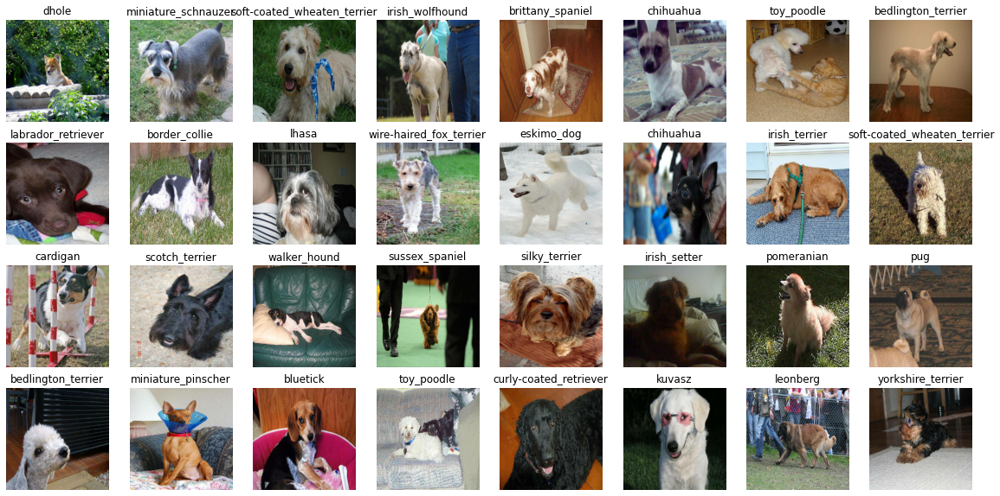

In [13]:
# plotting a batch
import matplotlib.pyplot as plt

t_images, t_labels = next(train_data.as_numpy_iterator())

plt.figure(figsize=(20, 10))
for i in range(32):
  ax = plt.subplot(4, 8, i+1)
  plt.imshow(t_images[i])
  plt.title(unique_labels[t_labels[i].argmax()])
  plt.axis("off")

# Model building

In [14]:
# model will be built using transfer learning

# input shape for the model
input_shape = [None, image_size, image_size, 3] # batch, height, width, channels

# output shape of the model
output_shape = len(unique_labels)

# model taken from tensorflow hub
model_url = "https://tfhub.dev/google/tf2-preview/mobilenet_v2/classification/4"

In [15]:
def create_model(i_shape=input_shape, o_shape=output_shape, m_url=model_url):
  """
  Creates a Keras deep learning model, given the input shape, output shape and model url
  """
  # model setup
  model = tf.keras.Sequential([
                        hub.KerasLayer(m_url), # input layer
                        tf.keras.layers.Dense(units=o_shape,
                                              activation="softmax") # output layer
  ])
  # model compiling
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  # model building
  model.build(i_shape)
  return model

In [16]:
model = create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              3540265   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 3,660,505
Trainable params: 120,240
Non-trainable params: 3,540,265
_________________________________________________________________


In [17]:
# create callbacks, to control the model's training

# tensorboard callback (logging)
%load_ext tensorboard
import datetime

def create_tensorboard_callback():
  """
  Creates a tensorboard callback
  """
  # create log directory
  log_dir = os.path.join("drive/MyDrive/Colab Notebooks/dog-breed-logs",
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(log_dir)

In [18]:
# early stopping callback (prevents overfitting)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3)

# Model training

In [19]:
nr_epochs = 100

def train_model(X_train=train_data, X_val=val_data, epochs=nr_epochs):
  """
  Creates and trains a model
  """
  model = create_model() # create model
  tensorboard = create_tensorboard_callback() # create tensorboard callback
  model.fit(x=X_train,
            epochs=epochs,
            validation_data=X_val,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping]
            ) # fit the model
  return model

In [20]:
model = train_model()

Epoch 1/100
125/125 [==============================] - 146s 878ms/step - loss: 2.1540 - accuracy: 0.5120 - val_loss: 0.8503 - val_accuracy: 0.7700
Epoch 2/100
125/125 [==============================] - 22s 172ms/step - loss: 0.4476 - accuracy: 0.8852 - val_loss: 0.7180 - val_accuracy: 0.7760
Epoch 3/100
125/125 [==============================] - 22s 175ms/step - loss: 0.2202 - accuracy: 0.9550 - val_loss: 0.6882 - val_accuracy: 0.7880
Epoch 4/100
125/125 [==============================] - 22s 178ms/step - loss: 0.1281 - accuracy: 0.9833 - val_loss: 0.6759 - val_accuracy: 0.7900
Epoch 5/100
125/125 [==============================] - 23s 182ms/step - loss: 0.0810 - accuracy: 0.9950 - val_loss: 0.6671 - val_accuracy: 0.7950
Epoch 6/100
125/125 [==============================] - 23s 182ms/step - loss: 0.0567 - accuracy: 0.9992 - val_loss: 0.6664 - val_accuracy: 0.8000
Epoch 7/100
125/125 [==============================] - 23s 183ms/step - loss: 0.0429 - accuracy: 0.9995 - val_loss: 0.6723 

In [21]:
# model is overfitting...check the tensorboard logs
%tensorboard --logdir content/drive/MyDrive/Colab\ Notebooks/dog-breed-logs

Output hidden; open in https://colab.research.google.com to view.

In [22]:
# full data training

# create batches with all data
full_data = create_batches(X, y)

In [23]:
# create model
full_model = create_model()

In [24]:
# create callbacks
full_tensorboard = create_tensorboard_callback()
full_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                       patience=3)

In [25]:
# fitting

full_model.fit(x=full_data,
               epochs=nr_epochs,
               callbacks=[full_tensorboard, full_early_stopping])

Epoch 1/100
320/320 [==============================] - 56s 159ms/step - loss: 1.2699 - accuracy: 0.6804
Epoch 2/100
320/320 [==============================] - 54s 169ms/step - loss: 0.3744 - accuracy: 0.8886
Epoch 3/100
320/320 [==============================] - 52s 161ms/step - loss: 0.2163 - accuracy: 0.9392
Epoch 4/100
320/320 [==============================] - 53s 164ms/step - loss: 0.1411 - accuracy: 0.9650
Epoch 5/100
320/320 [==============================] - 54s 168ms/step - loss: 0.0962 - accuracy: 0.9809
Epoch 6/100
320/320 [==============================] - 52s 162ms/step - loss: 0.0689 - accuracy: 0.9883
Epoch 7/100
320/320 [==============================] - 53s 166ms/step - loss: 0.0539 - accuracy: 0.9917
Epoch 8/100
320/320 [==============================] - 54s 170ms/step - loss: 0.0423 - accuracy: 0.9947
Epoch 9/100
320/320 [==============================] - 56s 174ms/step - loss: 0.0334 - accuracy: 0.9966
Epoch 10/100
320/320 [==============================] - 55s 171m

# Model evaluation

In [26]:
# make predictions

pred = model.predict(val_data)
pred

array([[2.58070620e-04, 1.75511195e-06, 8.08723962e-06, ...,
        1.14324200e-03, 3.96743853e-04, 5.23602813e-02],
       [2.33069409e-06, 3.36425692e-05, 2.36120559e-06, ...,
        1.52040515e-02, 1.14629359e-03, 4.12301997e-05],
       [7.25364998e-06, 1.55320413e-05, 3.61907865e-07, ...,
        3.66479776e-06, 1.40939835e-06, 2.70244698e-07],
       ...,
       [1.71278344e-07, 1.91284840e-07, 2.86104682e-06, ...,
        1.01319842e-04, 8.82390486e-06, 1.24462413e-05],
       [6.58428762e-05, 4.06533627e-06, 3.15717421e-06, ...,
        1.61826407e-04, 9.20683086e-01, 5.29771263e-04],
       [3.40533894e-08, 1.19786336e-07, 1.02524042e-04, ...,
        1.66139864e-06, 4.80971403e-06, 6.14585019e-07]], dtype=float32)

In [44]:
# we shall make the predictions more 'readable'

def get_pred_label(pred):
  """
  Transforms an array of prediction probabilities into a label
  """
  return unique_labels[np.argmax(pred)]

# we need to unbatch the batches to be able to make predictions on the validation images, 
# then compare those predictions to the validation (truth) labels
def unbatch(batch):
  """
  Unbatches a batched dataset of (image, label) Tensors
  """
  images, labels = [], []
  for img, lab in batch.unbatch().as_numpy_iterator():
    images.append(img)
    labels.append(unique_labels[np.argmax(lab)])
  return images, labels

val_images, val_labels = unbatch(val_data)

In [28]:
get_pred_label(val_labels[0])

'affenpinscher'

In [29]:
get_pred_label(pred[0])

'silky_terrier'

In [30]:
# visualize the predictions

def plot_pred(pred, labels, images, n=1):
  """
  View the prediction, truth and image for sample n
  """
  pred_prob, true, img = pred[n], labels[n], images[n]
  pred_label = get_pred_label(pred_prob)
  plt.imshow(img) # plot img
  plt.xticks([]) # remove ticks, to get the image clean
  plt.yticks([])
  plt.title(f"Predicted: {pred_label}\nAccuracy: {np.max(pred_prob)*100:2.0f}%\nTruth: {true}")

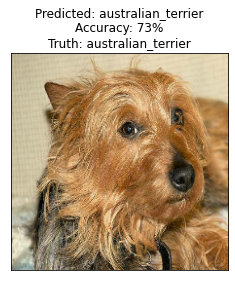

In [31]:
plot_pred(pred, val_labels, val_images, 9)

In [32]:
def plot_pred_conf(pred, labels, n=1):
  """
  Plots the top 10 highest prediction confidences for sample n
  """
  pred_prob, true = pred[n], labels[n]
  pred_label = get_pred_label(pred_prob)
  top_pred_indexes = pred_prob.argsort()[-10:][::-1] # top 10 predicition indexes
  top_pred_values = pred_prob[top_pred_indexes] # top 10 prediction values
  top_pred_labels = unique_labels[top_pred_indexes] # top 10 prediction labels
  # plot 
  plot = plt.bar(np.arange(len(top_pred_labels)),
                 top_pred_values,
                 color="black")
  plt.xticks(np.arange(len(top_pred_labels)),
             labels=top_pred_labels,
             rotation="vertical")
  if np.isin(true, top_pred_labels): # distinguish true label by setting color to green
    plot[np.argmax(top_pred_labels == true)].set_color("green")
  

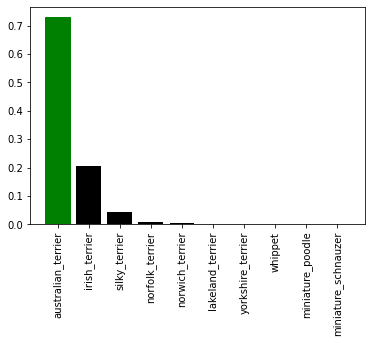

In [33]:
plot_pred_conf(pred, val_labels, 9)

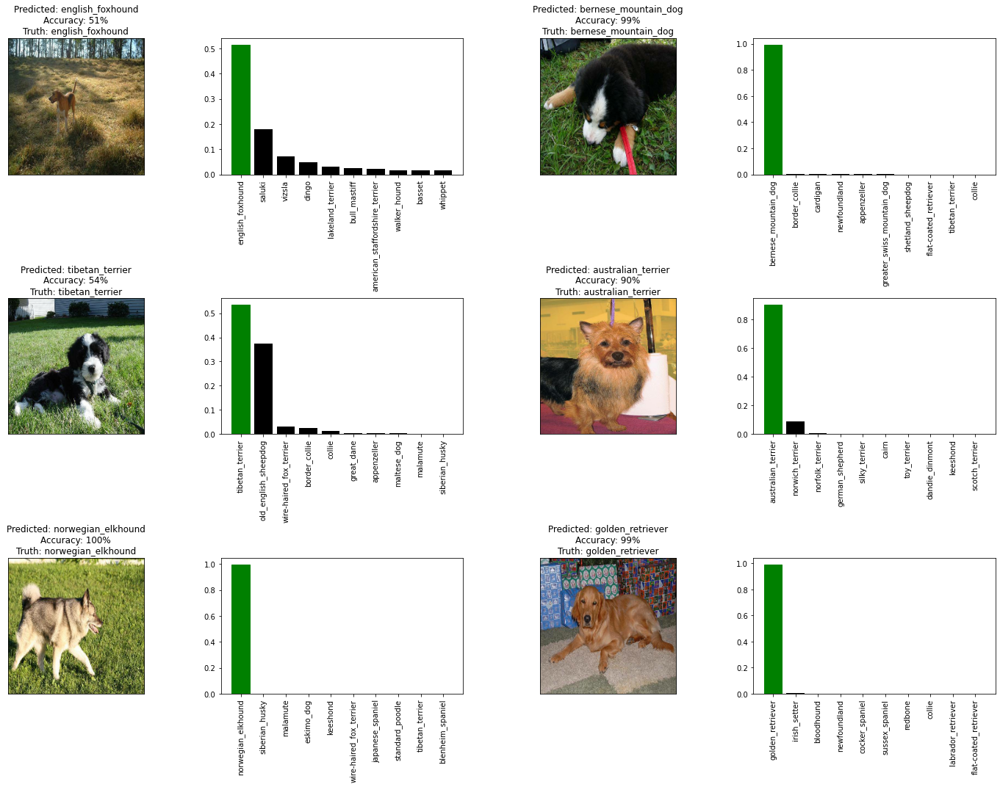

In [34]:
# plot multiple predictions

def plot_multiple(pred, labels, images, rows, cols):
  """
  Plots multiple predictions
  """
  num_images = rows * cols
  plt.figure(figsize=(10*cols, 5*rows))
  for i in range(num_images):
    plt.subplot(rows, 2*cols, 2*i+1)
    plot_pred(pred, labels, images, i+1)
    plt.subplot(rows, 2*cols, 2*i+2)
    plot_pred_conf(pred, labels, i+1)
  plt.tight_layout(h_pad=1.0)
  plt.show()

plot_multiple(pred, val_labels, val_images, 3, 2)

In [35]:
# test predictions on fully fitted model

# load test filepaths
test_dir = "drive/MyDrive/Colab Notebooks/dog-breed-data/test/"
test_paths = [test_dir + name for name in os.listdir(test_dir)]
test_paths[:5]

['drive/MyDrive/Colab Notebooks/dog-breed-data/test/e3d417026b89cbb57b00a7208421009d.jpg',
 'drive/MyDrive/Colab Notebooks/dog-breed-data/test/dce09c7574fbbe57f39606daf32e5445.jpg',
 'drive/MyDrive/Colab Notebooks/dog-breed-data/test/ddfe1bb4884e83421872030ac62835f1.jpg',
 'drive/MyDrive/Colab Notebooks/dog-breed-data/test/de291f05facd9c7db8d4880a0c84263b.jpg',
 'drive/MyDrive/Colab Notebooks/dog-breed-data/test/e008da6b957c62e7bcf6eb2ba4c2abd9.jpg']

In [36]:
# create batch
test_data = create_batches(test_paths)
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [37]:
# make predictions
test_pred = full_model.predict(test_data, verbose=1)

324/324 [==============================] - 198s 592ms/step


In [45]:
# visualize some of the predictions
test_pred_labels = [get_pred_label(test_pred[i]) for i in range(len(test_pred))]
test_pred_images = []
for img in test_data.unbatch().as_numpy_iterator():
  test_pred_images.append(img)

In [46]:
len(test_pred_images)

10357

In [47]:
len(test_pred_labels)

10357

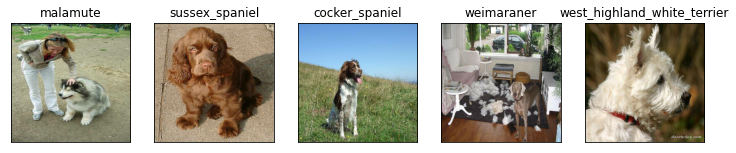

In [54]:
plt.figure(figsize=(15, 15))
for i, image in enumerate(test_pred_images[:5]):
  plt.subplot(1, 6, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(test_pred_labels[i])
  plt.imshow(image)

# Model import/export

In [55]:
def save_model(model, name):
  """
  Exports a given model
  """
  model_dir = os.path.join("drive/MyDrive/Colab Notebooks/dog-breed-exported",
                           datetime.datetime.now().strftime("%Y%m%d-%H%M"))
  path = model_dir + "-" + name + ".h5"
  model.save(path)
  return path

def load_model(path):
  """
  Imports a model found at given path
  """
  return tf.keras.models.load_model(path, custom_objects={"KerasLayer":hub.KerasLayer})

In [56]:
save_model(model, name="mobilenetv2")

'drive/MyDrive/Colab Notebooks/dog-breed-exported/20220225-1807-mobilenetv2.h5'

In [57]:
save_model(full_model, name="full-mobilenetv2")

'drive/MyDrive/Colab Notebooks/dog-breed-exported/20220225-1807-full-mobilenetv2.h5'